In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
import statsmodels.formula.api as smf
from scipy import stats

plt.style.use('seaborn-v0_8-poster')


In [2]:
def significance_marker(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""


def _draw_sig_line(ax, x1, x2, y, text, h=0.03):
    """Draw a flipped (downward) significance bracket below bars."""
    ax.plot((x1, x1, x2, x2),
            (y, y - h, y - h, y),
            lw=1.5, color="black", clip_on=False)
    if text:
        ax.text((x1 + x2) / 2.0, y - h * 1.2, text,
                ha="center", va="top",
                fontsize=14, fontweight="bold", color="black")


def get_matching_model_terms(model, variable):
    """
    Return model term names from model.params.index that match `variable`,
    excluding Group–Gender interactions.

    Behavior:
    ----------
    - If `variable` has no ':' or '*' → return only main-effect terms
      (e.g., 'Group' → ['Group[T.HC]'])
    - If `variable` includes ':' or '*' → return exact interaction terms
      (e.g., 'Group:Drug' → ['Group[T.HC]:Drug[T.Placebo]'])
    - If `variable` == 'two_way' → return *all* 2-way interactions
      (useful in 3-factor models like Group * Drug * Gender)
    - If `variable` == 'three_way' → return *all* 3-way interactions
    - Excludes Group–Gender interactions from all results.
    """

    # Remove intercept
    params = [p for p in model.params.index if p.lower() != "intercept"]

    # Helper: Exclude any Group–Gender interaction
    def is_group_gender_interaction(term):
        term_lower = term.lower()
        return "group" in term_lower and "gender" in term_lower

    # === Case 1: Request all 2-way interactions ===
    if variable.lower() == "two_way":
        return [p for p in params if p.count(":") == 1 and not is_group_gender_interaction(p)]

    # === Case 2: Request all 3-way interactions ===
    if variable.lower() == "three_way":
        return [p for p in params if p.count(":") == 2 and not is_group_gender_interaction(p)]

    # === Case 3: Single factor → main effects only ===
    if (":" not in variable) and ("*" not in variable):
        factor = variable
        return [p for p in params if p.startswith(factor + "[") and (":" not in p)]

    # === Case 4: Specific interaction (2-way or 3-way) ===
    var = variable.replace("*", ":")
    factors = [f for f in var.split(":") if f]

    out = []
    for p in params:
        # must have correct interaction order
        if p.count(":") != (len(factors) - 1):
            continue
        # must include all specified factors
        if all((f + "[") in p for f in factors):
            # exclude Group–Gender interactions
            if not is_group_gender_interaction(p):
                out.append(p)

    return out



def extract_factors_from_term(term):
    """
    Extract base factor names (e.g., 'Group', 'Drug', 'Gender') 
    from a statsmodels term like:
        'Group[T.HC]:Drug[T.Placebo]'  → ['Group', 'Drug']
        'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → ['Group', 'Drug', 'Gender']
        'Group[T.HC]' → ['Group']

    Works for both main and interaction terms.
    """
    # Split by ':' to separate interaction components
    parts = term.split(":")
    # For each part, take everything before the first '['
    factors = [p.split("[")[0] for p in parts]
    return factors

In [3]:
def add_sig_stars(ax, df, roi_list, variable, pad_frac=0.1, hue_order=None):
    """
    Generalized version that supports 2-way, 3-way, or higher-order interactions.

    Prints:
      1. Model result (ROI, variable, β, t, df, p)
      2. One-sample t-tests (ROI, factor level, mean, t, df, p)
    Adds * to bar plot for significant results.

    Automatically reads model factors from 'variable'.
    e.g. variable='Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → model='Z_score ~ Group * Drug * Gender'
    """

    ymin, ymax = ax.get_ylim()
    y_range = ymax - ymin
    is_interaction = ":" in variable

    # === Parse model factors dynamically ===
    # Example: 'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]' → ['Group', 'Drug', 'Gender']
    factors = list(dict.fromkeys([term.split("[")[0] for term in variable.split(":")]))
    formula = "Z_score ~ " + " * ".join(factors) + ("" if "guess" in factors else " + guess")

    print(f"\nModel results ({formula})")
    print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
    print("-" * 100)

    # === Table 1: Model results ===
    for i, roi in enumerate(roi_list):
        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        # 🔹 Dynamically specified model
        model = smf.ols(formula, data=df_roi).fit()

        if variable not in model.params.index:
            continue

        beta = model.params[variable]
        tval = model.tvalues[variable]
        pval = model.pvalues[variable]
        dfree = int(model.df_resid)
        star = significance_marker(pval)

        print(f"{roi:<15} {variable:<50} {beta:>10.3f} {tval:>8.2f} {dfree:>5} {pval:>8.3f} {star:>5}")

        # --- Bar selection per ROI ---
        bars = [r for r in ax.patches if abs((r.get_x() + r.get_width() / 2) - i) < 0.45]
        if not bars:
            continue

        # --- Draw flipped bracket for significant model effects (main effects only) ---
        if not is_interaction and star:
            bars_sorted = sorted(bars, key=lambda r: r.get_x())
            b1, b2 = bars_sorted[0], bars_sorted[-1]
            x1c = b1.get_x() + b1.get_width() / 2
            x2c = b2.get_x() + b2.get_width() / 2
            x_mid = (x1c + x2c) / 2
            y1 = b1.get_y() + b1.get_height()
            y2 = b2.get_y() + b2.get_height()
            min_y = min(y1, y2)
            y_bracket = min_y - 0.3
            y_star = min_y - 0.4
            _draw_sig_line(ax, x1c, x2c, y_bracket, "", h=y_range * 0.03)
            ax.text(x_mid, y_star, star,
                    ha="center", va="top",
                    fontsize=14, fontweight="bold", color="black")

    print("-" * 100)

    # === Table 2: One-sample t-tests ===
    if is_interaction:
        group_factors = factors
        print(f"ONE-SAMPLE T-TESTS BY INTERACTION LEVEL ({' × '.join(group_factors)})")
    else:
        group_factors = [factors[0]]
        print(f"ONE-SAMPLE T-TESTS BY {group_factors[0].upper()} LEVEL")

    print(f"{'ROI':<15} {'Level':<50} {'Mean':>10} {'t':>8} {'df':>6} {'p':>10} {'Sig':>5}")
    print("-" * 100)

    for i, roi in enumerate(roi_list):
        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        bars = [r for r in ax.patches if abs((r.get_x() + r.get_width() / 2) - i) < 0.45]

        # === Main effect ===
        if len(group_factors) == 1:
            factor = group_factors[0]
            if factor not in df_roi.columns:
                continue

            for level, vals in df_roi.groupby(factor, observed=False):
                if len(vals) < 3:
                    continue
                tstat, pval = stats.ttest_1samp(vals["Z_score"], 0)
                dfree = len(vals) - 1
                mean_val = np.mean(vals["Z_score"])
                star = significance_marker(pval)
                label = f"{factor}={level}"
                print(f"{roi:<15} {label:<50} {mean_val:>10.3f} {tstat:>8.2f} {dfree:>6} {pval:>10.3f} {star:>5}")

                if star:
                    if hue_order is None:
                        hue_order = list(df[factor].cat.categories)
                    level_to_bar = dict(zip(hue_order, bars))
                    if level in level_to_bar:
                        rect = level_to_bar[level]
                        cx = rect.get_x() + rect.get_width() / 2
                        top = rect.get_y() + rect.get_height()
                        y_star = 0.04 if mean_val <= 0 else top + y_range * pad_frac + 0.2
                        ax.text(cx, y_star, star,
                                ha="center", va="bottom",
                                fontsize=14, fontweight="bold", color="black")

        # === Interaction effect (2-way, 3-way, or higher) ===
        else:
            valid_factors = [f for f in group_factors if f in df_roi.columns]
            if len(valid_factors) < 2:
                continue

            for levels, vals in df_roi.groupby(valid_factors, observed=False):
                if len(vals) < 3:
                    continue
                tstat, pval = stats.ttest_1samp(vals["Z_score"], 0)
                dfree = len(vals) - 1
                mean_val = np.mean(vals["Z_score"])
                star = significance_marker(pval)
                level_labels = "_".join(map(str, levels))
                print(f"{roi:<15} {level_labels:<50} {mean_val:>10.3f} "
                      f"{tstat:>8.2f} {dfree:>6} {pval:>10.3f} {star:>5}")

                if star:
                    # Build hue order dynamically based on unique combinations
                    if hue_order is None:
                        hue_order = [
                            "_".join(map(str, combo))
                            for combo in df_roi[valid_factors]
                            .drop_duplicates()
                            .itertuples(index=False, name=None)
                        ]
                    level_to_bar = dict(zip(hue_order, bars))
                    key = "_".join(map(str, levels))
                    if key in level_to_bar:
                        rect = level_to_bar[key]
                        cx = rect.get_x() + rect.get_width() / 2
                        top = rect.get_y() + rect.get_height()
                        y_star = 0.04 if mean_val <= 0 else top + y_range * pad_frac + 0.2
                        ax.text(cx, y_star, star,
                                ha="center", va="bottom",
                                fontsize=14, fontweight="bold", color="black")

    print("-" * 100)


In [4]:
def add_sig_stars_lineplot_interaction(ax, df, roi_list, variable):
    """
    Adds significance stars (***, **, *) to each subplot's title
    if the specified interaction term in `variable` is significant
    for that ROI.

    Automatically supports 2-way, 3-way, or higher-order interactions.
    e.g.:
        'Group[T.HC]:Gender[T.Female]'
        'Group[T.HC]:Drug[T.Placebo]:Gender[T.Female]'
    """

    # Extract main factors from variable (remove duplicates safely)
    factors = list(dict.fromkeys([term.split("[")[0] for term in variable.split(":")]))
    formula = "Z_score ~ " + " * ".join(factors) + ("" if "guess" in factors else " + guess")

    axes = ax.flat if hasattr(ax, "flat") else [ax]

    print(f"\n=== Lineplot significance check for {variable} ===")
    print(f"Model formula: {formula}")
    print(f"{'ROI':<15} {'p-value':>10} {'Sig':>5}")
    print("-" * 35)

    for i, roi in enumerate(roi_list):
        if i >= len(axes):
            break
        ax_i = axes[i]

        df_roi = df[df["ROI"] == roi]
        if len(df_roi) < 4:
            continue

        # Dynamically fit model with all relevant factors
        model = smf.ols(formula, data=df_roi).fit()

        # Skip if the term is not part of the model
        if variable not in model.pvalues.index:
            continue

        # Get p-value and significance marker
        pval = model.pvalues[variable]
        star = significance_marker(pval)

        # Update subplot title with star if significant
        current_title = ax_i.get_title()
        new_title = f"{current_title} {star}" if star else current_title
        ax_i.set_title(new_title, fontweight="bold" if star else "normal")

        print(f"{roi:<15} {pval:>10.4f} {star:>5}")

    print("-" * 35)


In [5]:
tasks = ['phase2','phase3']
contrast_list = [
        "CSR-CSS",   
        "CSR-CS-",
        "CSS-CS-",
        "CSR-fix", 
        "CSS-fix",   
        "CSminus-fix"
        ]
ROI_list = [
        'Amygdala', 'Insula', 'Hippocampus', 'ACC', 
        'VMPFC'
        ]
group_list = [
        'Patient',
        'HC'
        ]
drug_list = ['Oxytocin',
        'Placebo']
gender_list = ['Male', 'Female']
guess_list = ['no', 'yes']

In [6]:
plot_dir_top = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/derivatives/fMRI_analysis/ROI/plots/model-guess-noGroupGenderInteraction_motion-ori'
drug_order_file = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/source_data/behav/drug_order.xlsx'
df_drug_order = pd.read_excel(drug_order_file, 'drug_order')
first_level_dir = '/Users/xiaoqianxiao/Projects/NARSAD/MRI/derivatives/fMRI_analysis/ROI'
first_level_data_file = os.path.join(first_level_dir, 'first_level.csv')
df_fMRI = pd.read_csv(first_level_data_file)
df_merged = pd.merge(df_fMRI, df_drug_order, on='subID', how='left')
df_all = df_merged.rename(columns={
    'Task': 'Phase'
})
df_all.loc[df_all['subID'].str.startswith('N1'), 'Group'] = 'Patient'
df_all.loc[df_all['subID'].str.startswith('N2'), 'Group'] = 'HC'
categorical_cols = ['ROI', 'subID', 'Phase', 'Contrast', 'Group', 'Gender', 'Drug','guess']
df_all[categorical_cols] = df_all[categorical_cols].astype('category')
df_all['Contrast'] = df_all['Contrast'].cat.set_categories(contrast_list, ordered=True)
df_all['ROI'] = df_all['ROI'].cat.set_categories(ROI_list, ordered=True)
df_all['Group'] = df_all['Group'].cat.set_categories(group_list, ordered=True)
df_all['Drug'] = df_all['Drug'].cat.set_categories(drug_list, ordered=True)
df_all['Gender'] = df_all['Gender'].cat.set_categories(gender_list, ordered=True)
df_all['guess'] = df_all['guess'].map({0.0: 'no', 1.0: 'yes'})
df_all['guess'] = pd.Categorical(df_all['guess'], categories=['no', 'yes'])

In [7]:
print(len(df_fMRI.loc[df_fMRI['Task']=='phase2']['subID'].unique()))
print(len(df_fMRI.loc[df_fMRI['Task']=='phase3']['subID'].unique()))
print(len(df_drug_order['subID'].unique()))

100
101
104


In [8]:
# Subjects in drug order but missing from fMRI data
missing_in_fMRI = df_drug_order.loc[
    ~df_drug_order['subID'].isin(df_fMRI.loc[df_fMRI['Task']=='phase2']['subID']), 'subID'
].unique()

print(f"🧩 Subjects in drug order file but not in fMRI data in phase2: {len(missing_in_fMRI)}")
print(missing_in_fMRI)

missing_in_fMRI = df_drug_order.loc[
    ~df_drug_order['subID'].isin(df_fMRI.loc[df_fMRI['Task']=='phase3']['subID']), 'subID'
].unique()

print(f"🧩 Subjects in drug order file but not in fMRI data in phase3: {len(missing_in_fMRI)}")
print(missing_in_fMRI)
# SUBJECTS_NO_MRI = {
#     'phase2': ['N102', 'N208'],
#     'phase3': ['N102', 'N208', 'N120']
# }
# removing subjects w wrong sequence / missing phases:
# sub101 has 2mm seq for phase 2, 3mm (correct) for phase 3
# sub201, has 2mm seq for phase 2, 3mm (correct) for phase 3



🧩 Subjects in drug order file but not in fMRI data in phase2: 4
['N101' 'N102' 'N201' 'N208']
🧩 Subjects in drug order file but not in fMRI data in phase3: 3
['N102' 'N120' 'N208']


Reinstatement

Entire

In [9]:
plot_dir = os.path.join(plot_dir_top, 'reinstatement/entire_dataset')
os.makedirs(plot_dir, exist_ok=True)
model = smf.ols("Z_score ~ Group * Drug * Gender + guess", data=df_all).fit()


===== Group main effect: CSR-CSS =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.172    -0.71    98    0.478      
Insula          guess[T.yes]                                            0.070     0.27    98    0.788      
Hippocampus     guess[T.yes]                                           -0.010    -0.04    98    0.970      
ACC             guess[T.yes]                                            0.107     0.41    98    0.682      
VMPFC           guess[T.yes]                                           -0.112    -0.40    98    0.692      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

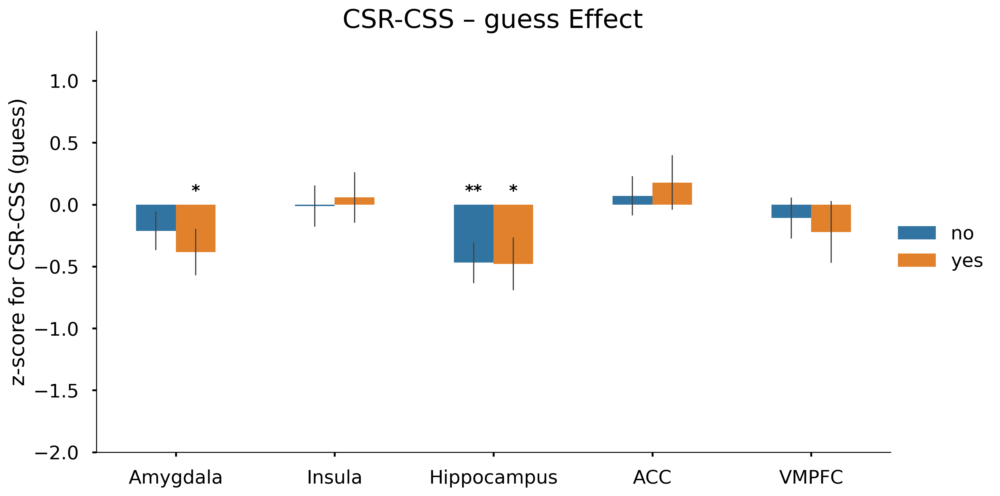


===== Group main effect: CSR-CS- =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.340    -1.42    98    0.158      
Insula          guess[T.yes]                                            0.025     0.09    98    0.932      
Hippocampus     guess[T.yes]                                           -0.210    -0.69    98    0.490      
ACC             guess[T.yes]                                            0.129     0.44    98    0.661      
VMPFC           guess[T.yes]                                           -0.007    -0.02    98    0.981      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

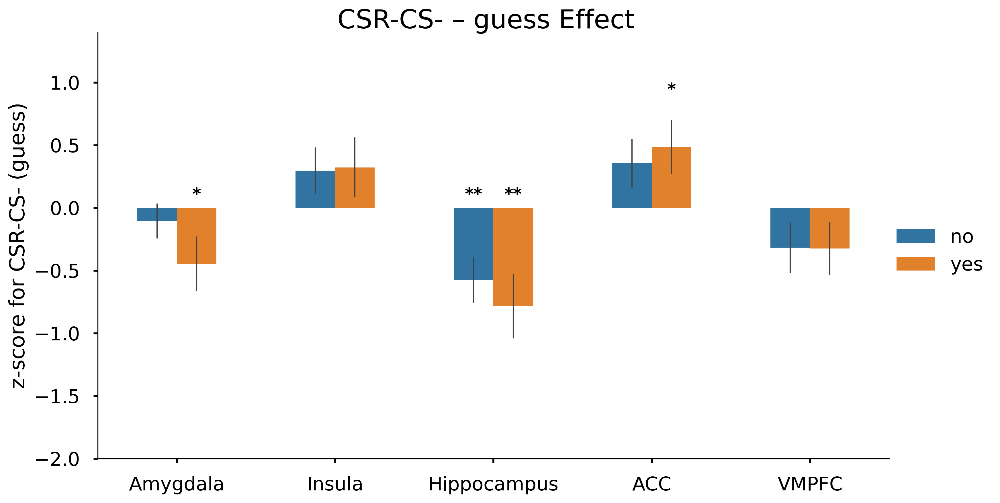


===== Group main effect: CSS-CS- =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.149    -0.66    98    0.512      
Insula          guess[T.yes]                                           -0.032    -0.11    98    0.913      
Hippocampus     guess[T.yes]                                           -0.192    -0.76    98    0.449      
ACC             guess[T.yes]                                            0.028     0.10    98    0.921      
VMPFC           guess[T.yes]                                            0.116     0.42    98    0.676      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

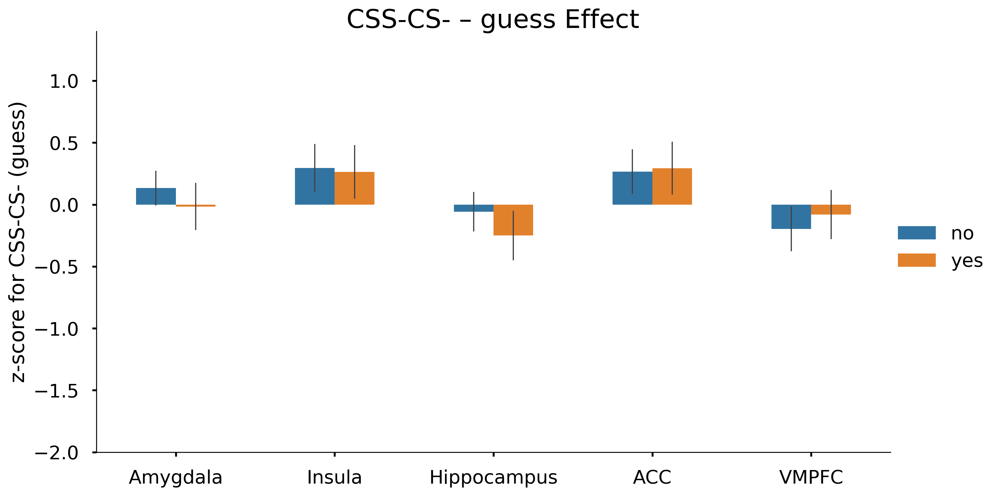


===== Group main effect: CSR-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                           -0.201    -0.76    98    0.451      
Insula          guess[T.yes]                                            0.312     1.26    98    0.212      
Hippocampus     guess[T.yes]                                           -0.059    -0.19    98    0.846      
ACC             guess[T.yes]                                            0.435     1.47    98    0.144      
VMPFC           guess[T.yes]                                            0.094     0.32    98    0.752      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

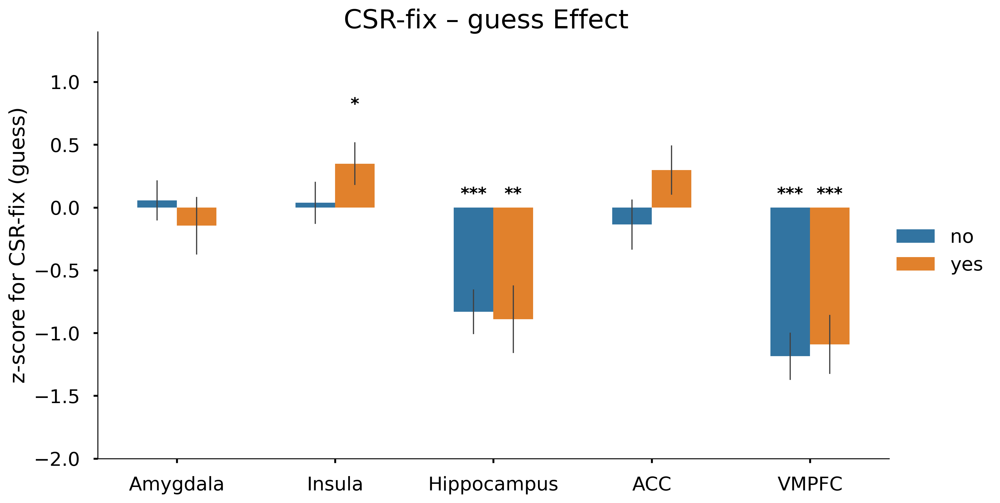


===== Group main effect: CSS-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                            0.030     0.13    98    0.900      
Insula          guess[T.yes]                                            0.205     0.78    98    0.436      
Hippocampus     guess[T.yes]                                           -0.043    -0.18    98    0.860      
ACC             guess[T.yes]                                            0.275     1.03    98    0.304      
VMPFC           guess[T.yes]                                            0.253     0.86    98    0.392      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                      

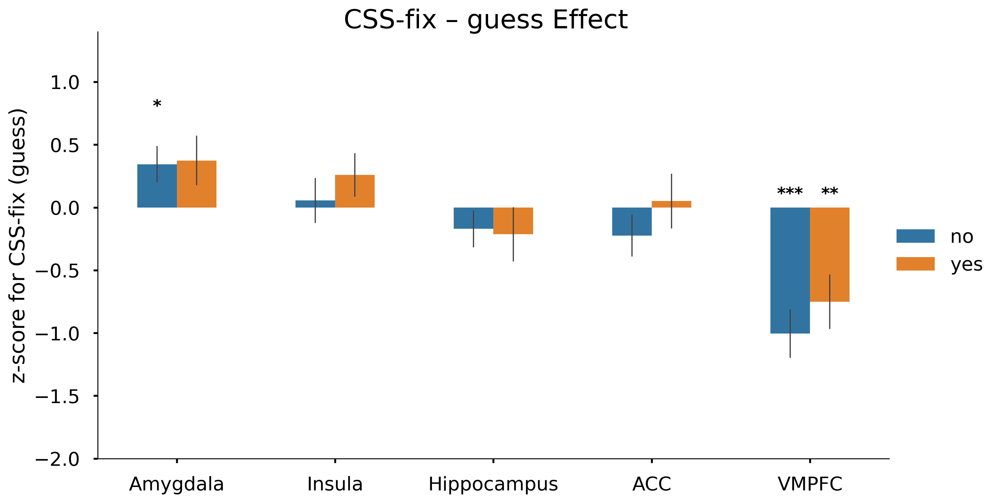


===== Group main effect: CSminus-fix =====

Model results (Z_score ~ guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        guess[T.yes]                                            0.246     1.04    98    0.299      
Insula          guess[T.yes]                                            0.293     0.98    98    0.331      
Hippocampus     guess[T.yes]                                            0.220     0.85    98    0.400      
ACC             guess[T.yes]                                            0.290     0.97    98    0.332      
VMPFC           guess[T.yes]                                            0.119     0.41    98    0.680      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GUESS LEVEL
ROI             Level                  

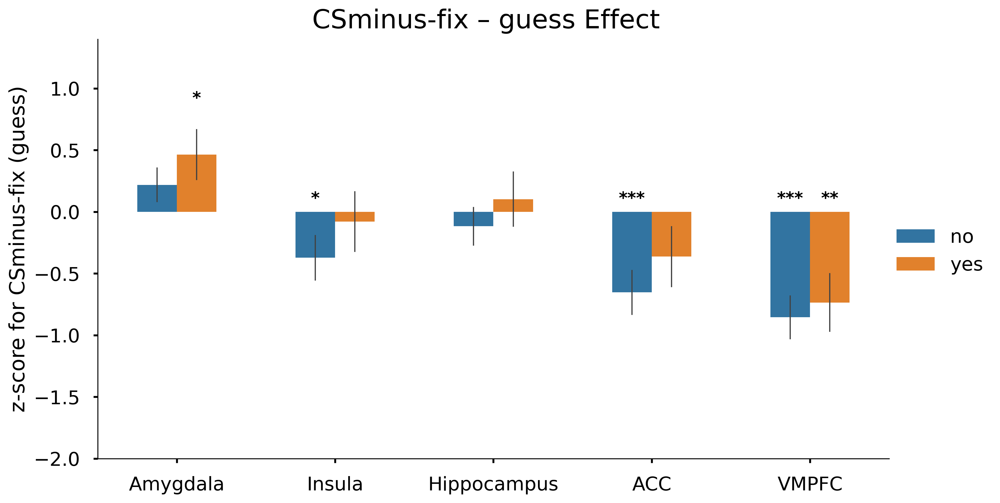

In [10]:
# 1️⃣ Guess main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Group main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase2')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='guess',
        order=ROI_list, hue_order=guess_list,
        kind='bar', errorbar='se', 
        height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "guess")[0], hue_order=guess_list)


    g.set_axis_labels('', f'z-score for {contrast} (guess)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – guess Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_guess_sig.png', bbox_inches='tight')
    plt.show()


===== Group main effect: CSR-CSS =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.072     0.29    98    0.769      
Insula          Group[T.HC]                                             0.115     0.40    98    0.688      
Hippocampus     Group[T.HC]                                             0.111     0.44    98    0.662      
ACC             Group[T.HC]                                             0.213     0.80    98    0.423      
VMPFC           Group[T.HC]                                             0.380     1.56    98    0.121      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

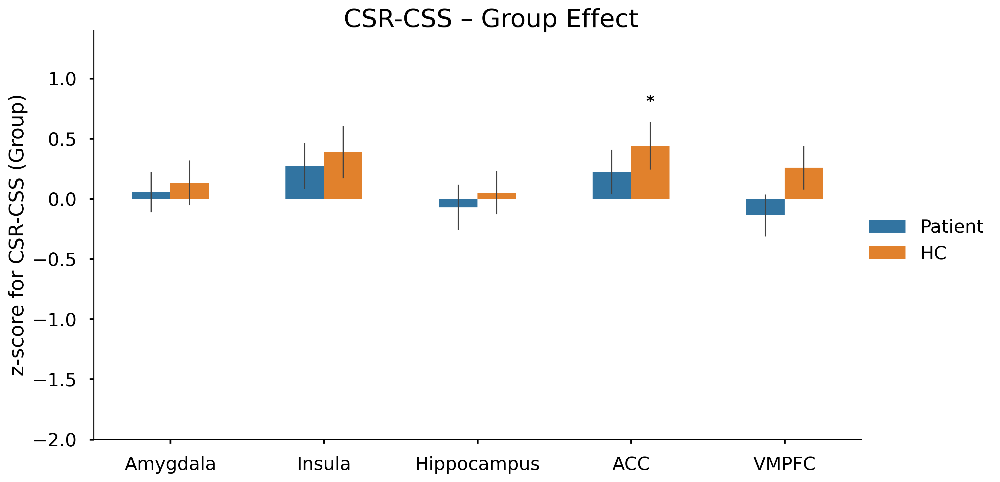


===== Group main effect: CSR-CS- =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.105    -0.39    98    0.699      
Insula          Group[T.HC]                                             0.153     0.54    98    0.592      
Hippocampus     Group[T.HC]                                             0.061     0.23    98    0.822      
ACC             Group[T.HC]                                             0.314     1.10    98    0.275      
VMPFC           Group[T.HC]                                            -0.013    -0.05    98    0.960      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

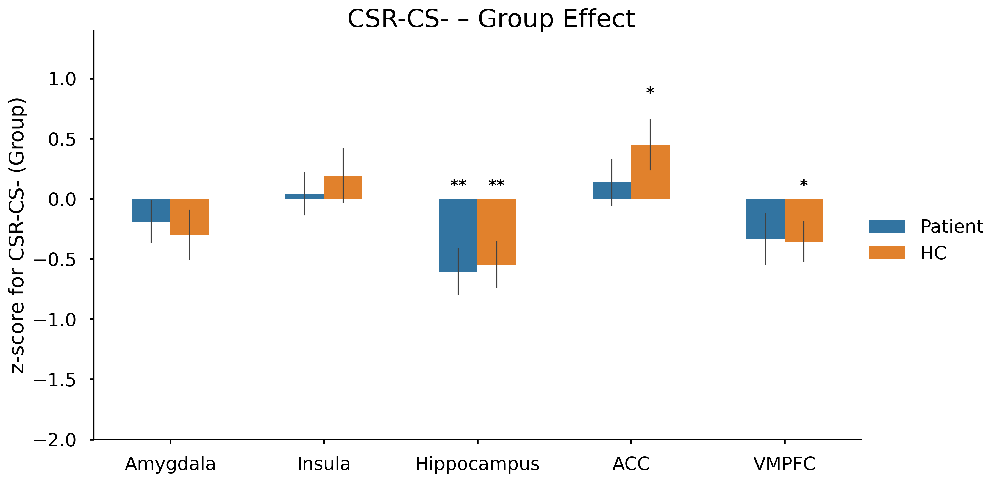


===== Group main effect: CSS-CS- =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.157    -0.62    98    0.538      
Insula          Group[T.HC]                                             0.063     0.25    98    0.803      
Hippocampus     Group[T.HC]                                            -0.036    -0.15    98    0.885      
ACC             Group[T.HC]                                             0.122     0.45    98    0.650      
VMPFC           Group[T.HC]                                            -0.380    -1.59    98    0.115      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

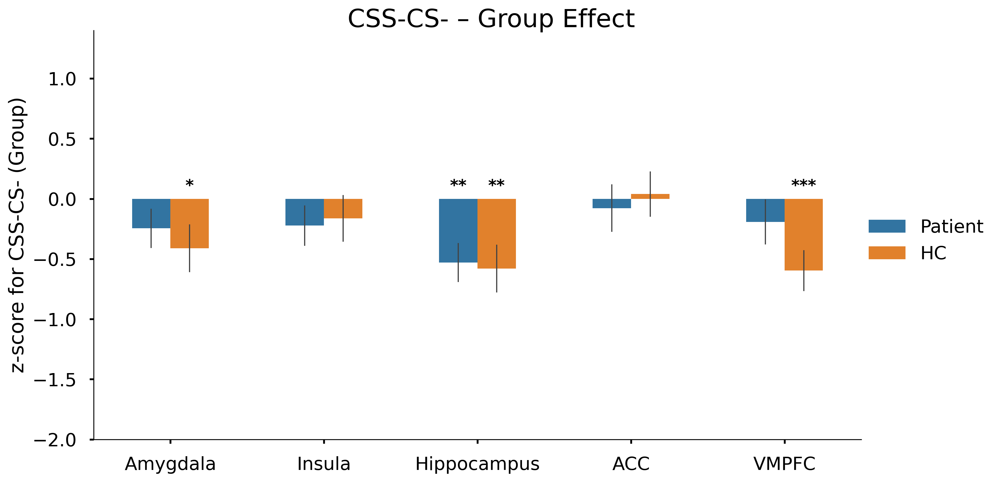


===== Group main effect: CSR-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.101     0.33    98    0.745      
Insula          Group[T.HC]                                             0.174     0.53    98    0.596      
Hippocampus     Group[T.HC]                                            -0.198    -0.72    98    0.474      
ACC             Group[T.HC]                                             0.175     0.59    98    0.557      
VMPFC           Group[T.HC]                                             0.065     0.26    98    0.797      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

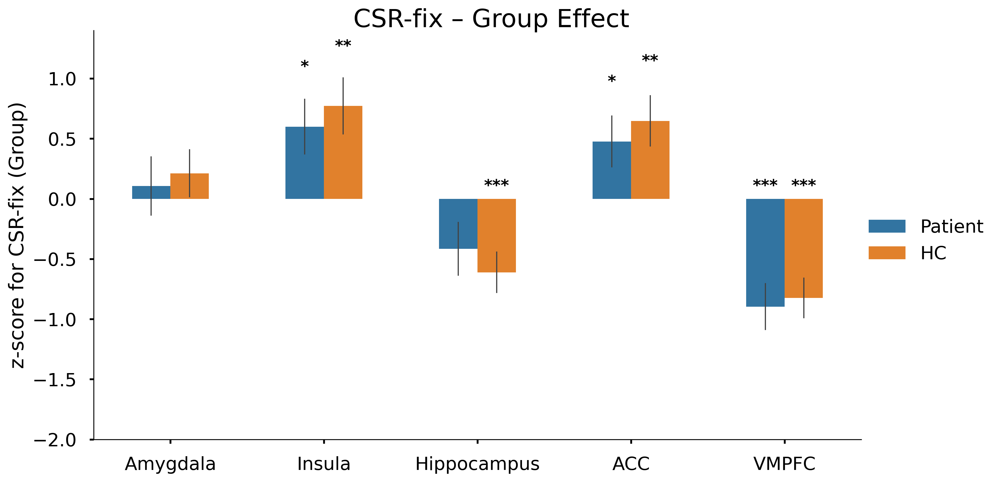


===== Group main effect: CSS-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.007    -0.02    98    0.981      
Insula          Group[T.HC]                                             0.032     0.13    98    0.898      
Hippocampus     Group[T.HC]                                            -0.350    -1.26    98    0.210      
ACC             Group[T.HC]                                            -0.089    -0.32    98    0.750      
VMPFC           Group[T.HC]                                            -0.433    -1.60    98    0.114      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level              

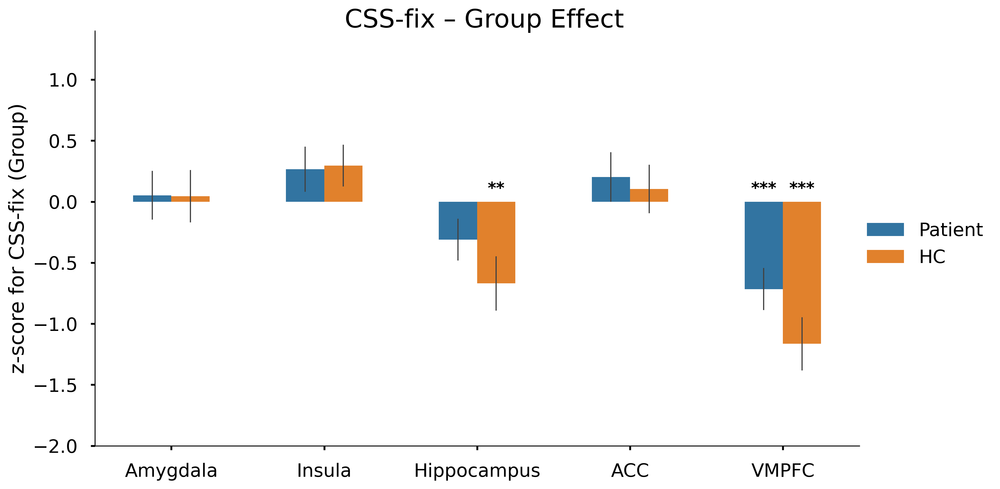


===== Group main effect: CSminus-fix =====

Model results (Z_score ~ Group + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.202     0.75    98    0.455      
Insula          Group[T.HC]                                            -0.045    -0.17    98    0.866      
Hippocampus     Group[T.HC]                                            -0.266    -0.94    98    0.352      
ACC             Group[T.HC]                                            -0.241    -0.92    98    0.360      
VMPFC           Group[T.HC]                                             0.071     0.29    98    0.769      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GROUP LEVEL
ROI             Level          

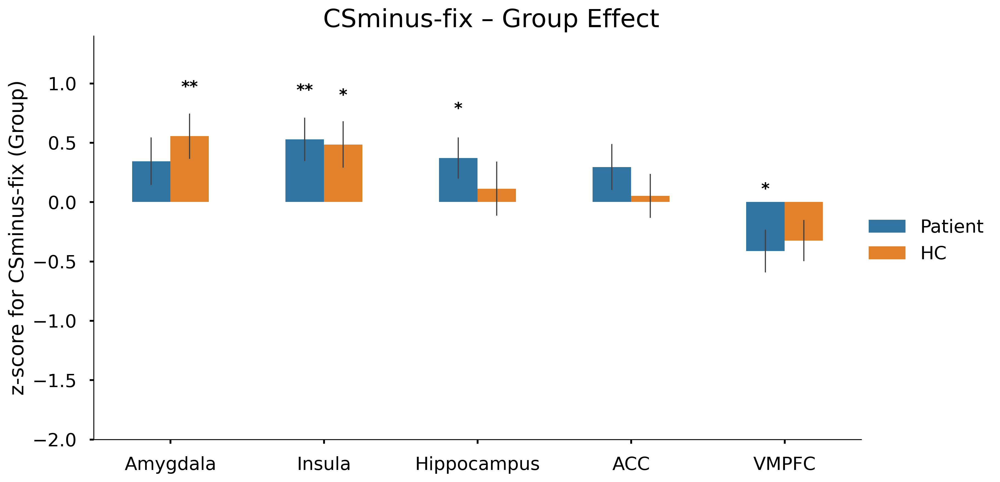

In [10]:
# 1️⃣ Group main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Group main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Group',
        order=ROI_list, hue_order=group_list,
        kind='bar', errorbar='se', 
        height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Group")[0], hue_order=group_list)


    g.set_axis_labels('', f'z-score for {contrast} (Group)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Group Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Group_sig.png', bbox_inches='tight')
    plt.show()


===== Gender main effect: CSR-CSS =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.159    -0.63    98    0.532      
Insula          Drug[T.Placebo]                                        -0.469    -1.60    98    0.112      
Hippocampus     Drug[T.Placebo]                                         0.161     0.62    98    0.539      
ACC             Drug[T.Placebo]                                        -0.209    -0.76    98    0.448      
VMPFC           Drug[T.Placebo]                                        -0.084    -0.33    98    0.741      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

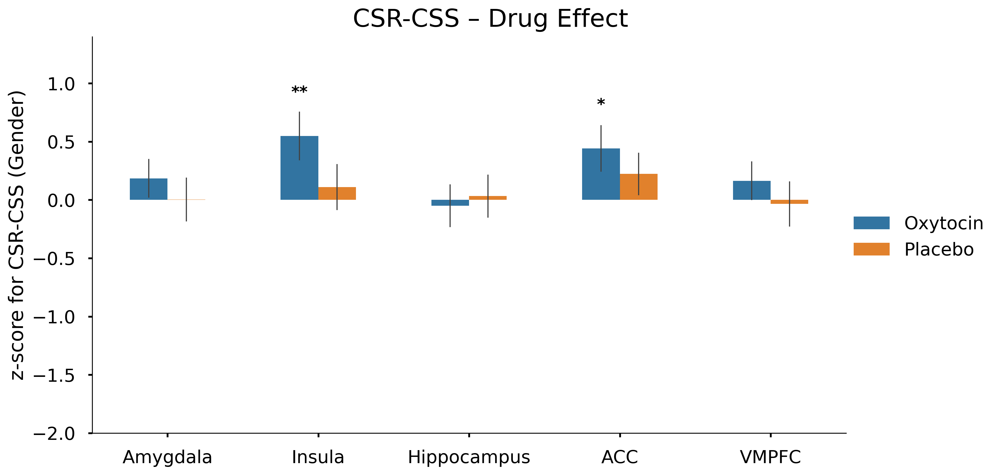


===== Gender main effect: CSR-CS- =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.244    -0.87    98    0.384      
Insula          Drug[T.Placebo]                                        -0.271    -0.92    98    0.359      
Hippocampus     Drug[T.Placebo]                                        -0.084    -0.30    98    0.764      
ACC             Drug[T.Placebo]                                         0.076     0.25    98    0.799      
VMPFC           Drug[T.Placebo]                                         0.262     0.97    98    0.337      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

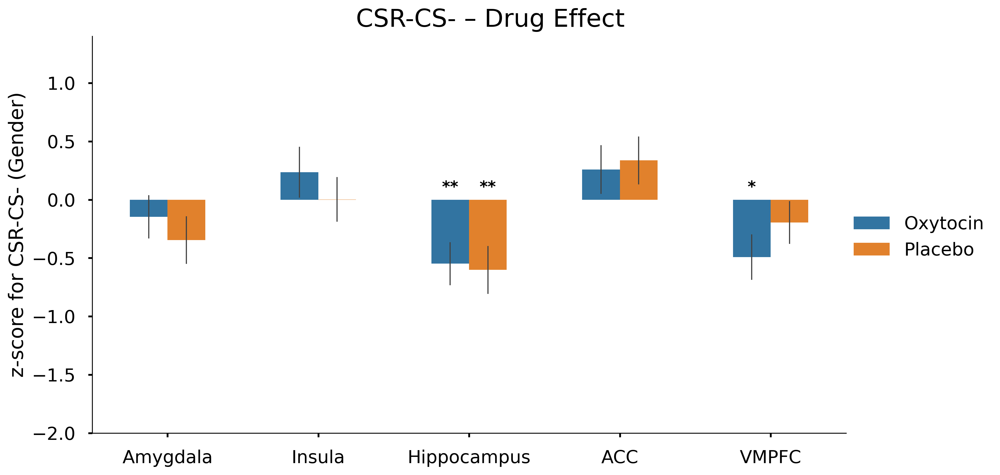


===== Gender main effect: CSS-CS- =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.086    -0.33    98    0.743      
Insula          Drug[T.Placebo]                                         0.170     0.65    98    0.515      
Hippocampus     Drug[T.Placebo]                                        -0.229    -0.89    98    0.376      
ACC             Drug[T.Placebo]                                         0.257     0.93    98    0.353      
VMPFC           Drug[T.Placebo]                                         0.337     1.36    98    0.177      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

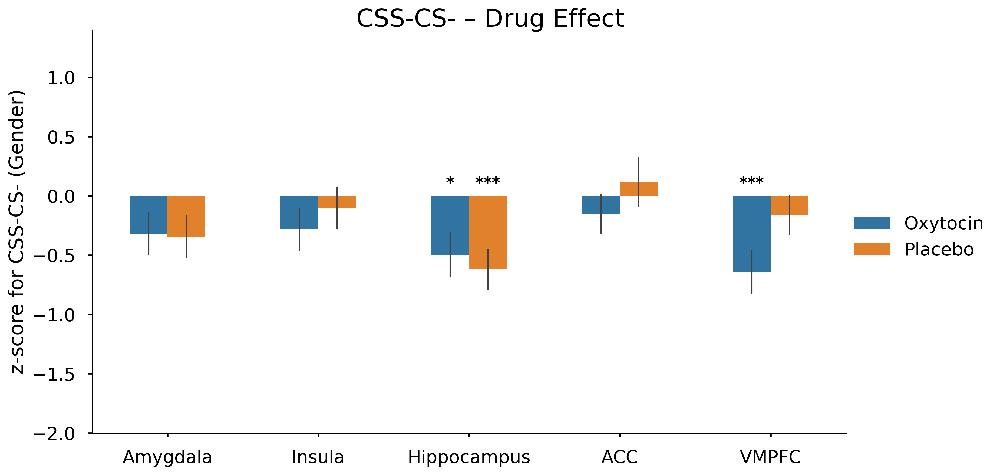


===== Gender main effect: CSR-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.245    -0.77    98    0.446      
Insula          Drug[T.Placebo]                                        -0.256    -0.76    98    0.450      
Hippocampus     Drug[T.Placebo]                                         0.175     0.61    98    0.541      
ACC             Drug[T.Placebo]                                        -0.080    -0.26    98    0.796      
VMPFC           Drug[T.Placebo]                                         0.059     0.23    98    0.821      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

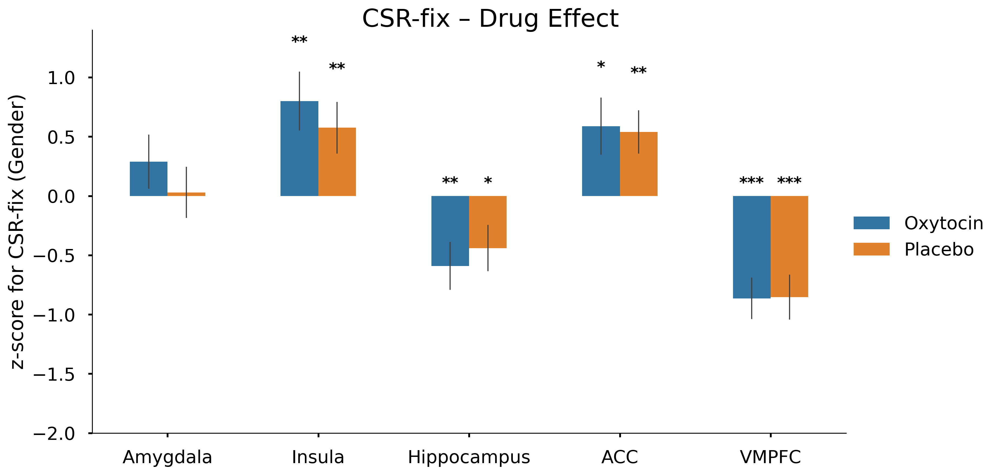


===== Gender main effect: CSS-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.041    -0.14    98    0.891      
Insula          Drug[T.Placebo]                                         0.340     1.35    98    0.181      
Hippocampus     Drug[T.Placebo]                                        -0.036    -0.12    98    0.902      
ACC             Drug[T.Placebo]                                         0.173     0.60    98    0.549      
VMPFC           Drug[T.Placebo]                                         0.149     0.52    98    0.602      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level               

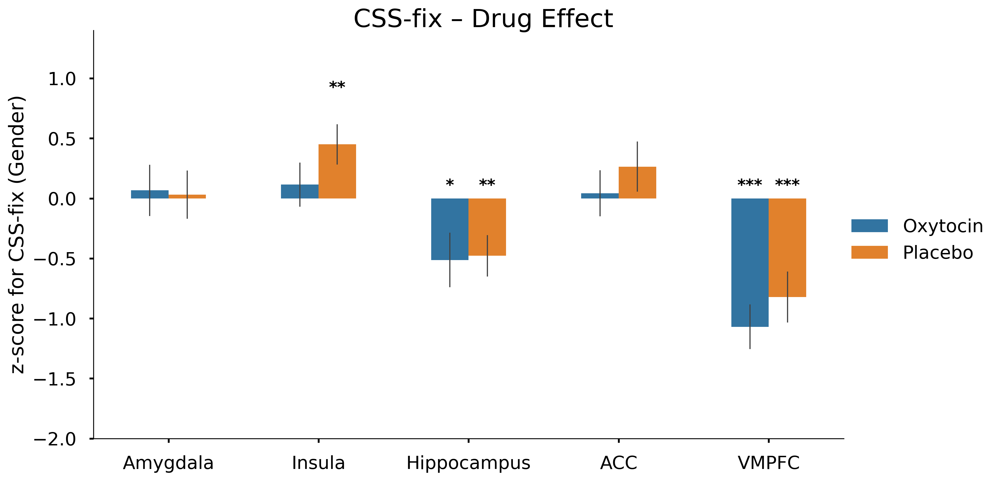


===== Gender main effect: CSminus-fix =====

Model results (Z_score ~ Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                         0.075     0.27    98    0.790      
Insula          Drug[T.Placebo]                                         0.108     0.40    98    0.693      
Hippocampus     Drug[T.Placebo]                                         0.279     0.95    98    0.344      
ACC             Drug[T.Placebo]                                        -0.182    -0.67    98    0.505      
VMPFC           Drug[T.Placebo]                                        -0.301    -1.21    98    0.228      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY DRUG LEVEL
ROI             Level           

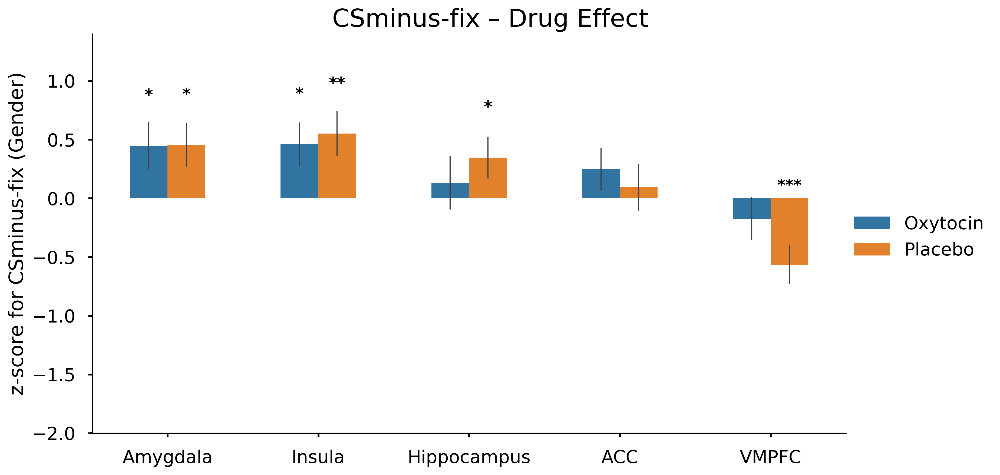

In [11]:
# ---------------------------------------------------------
# 3️⃣ Drug main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Gender main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Drug',
        order=ROI_list, kind='bar', errorbar='se', height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Drug")[0])

    g.set_axis_labels('', f'z-score for {contrast} (Gender)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Drug Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Drug_sig.png', bbox_inches='tight')
    plt.show()


===== Gender main effect: CSR-CSS =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                       -0.324    -1.33    98    0.188      
Insula          Gender[T.Female]                                        0.013     0.04    98    0.965      
Hippocampus     Gender[T.Female]                                       -0.286    -1.13    98    0.261      
ACC             Gender[T.Female]                                       -0.049    -0.18    98    0.855      
VMPFC           Gender[T.Female]                                        0.079     0.32    98    0.751      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

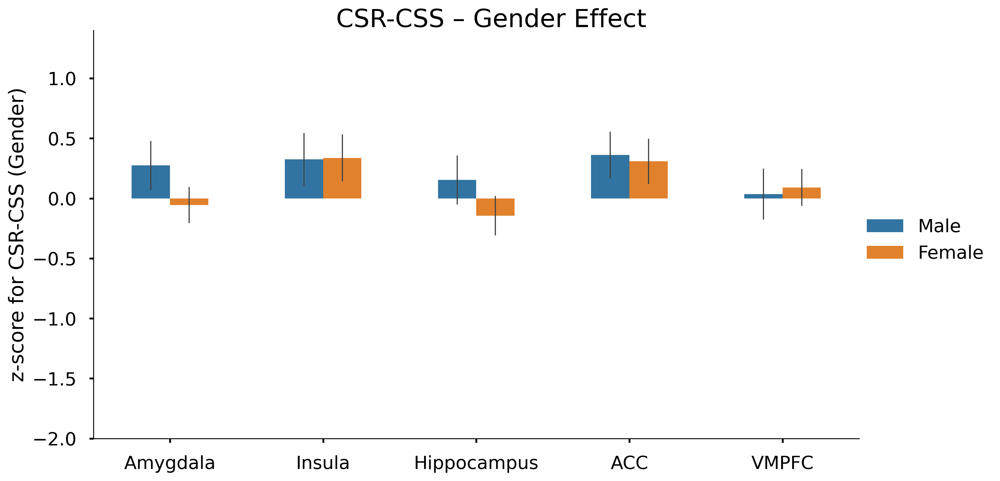


===== Gender main effect: CSR-CS- =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                       -0.438    -1.63    98    0.106      
Insula          Gender[T.Female]                                       -0.081    -0.28    98    0.779      
Hippocampus     Gender[T.Female]                                       -0.349    -1.30    98    0.198      
ACC             Gender[T.Female]                                       -0.002    -0.01    98    0.993      
VMPFC           Gender[T.Female]                                        0.263     1.00    98    0.321      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

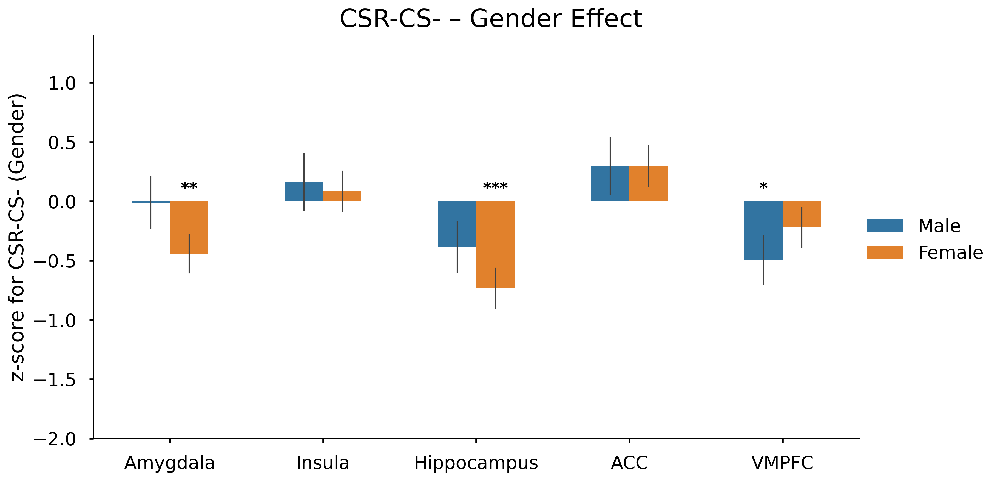


===== Gender main effect: CSS-CS- =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                       -0.119    -0.47    98    0.642      
Insula          Gender[T.Female]                                       -0.087    -0.34    98    0.732      
Hippocampus     Gender[T.Female]                                       -0.077    -0.31    98    0.761      
ACC             Gender[T.Female]                                        0.041     0.15    98    0.880      
VMPFC           Gender[T.Female]                                        0.182     0.75    98    0.454      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

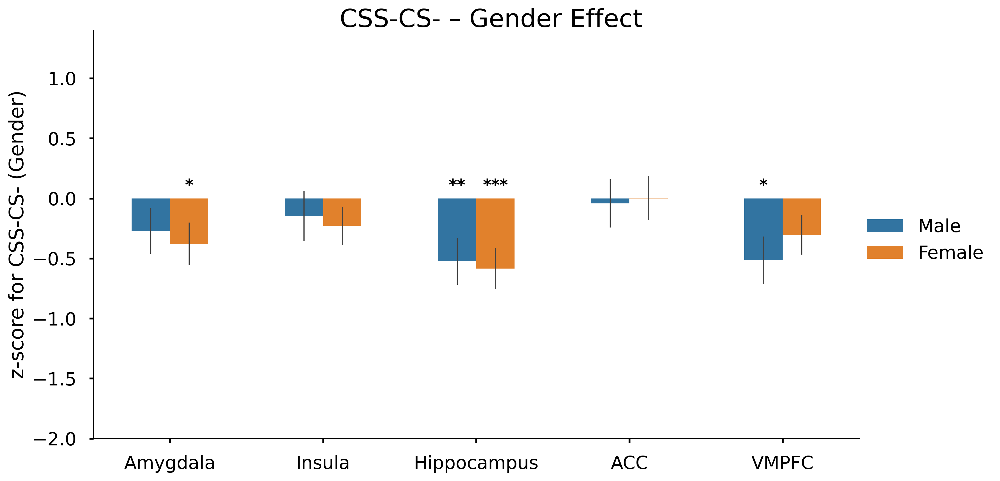


===== Gender main effect: CSR-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                       -0.296    -0.95    98    0.343      
Insula          Gender[T.Female]                                       -0.171    -0.52    98    0.603      
Hippocampus     Gender[T.Female]                                       -0.243    -0.88    98    0.381      
ACC             Gender[T.Female]                                       -0.544    -1.85    98    0.068      
VMPFC           Gender[T.Female]                                        0.002     0.01    98    0.993      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

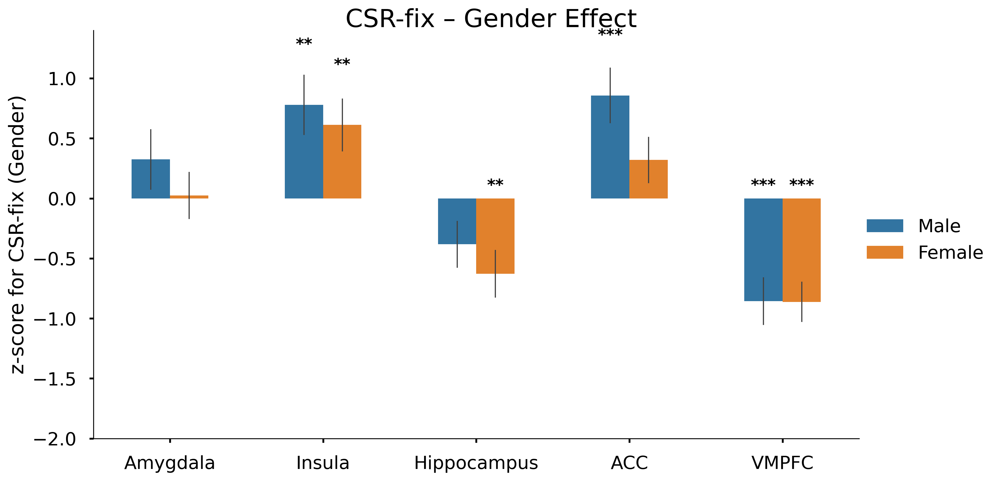


===== Gender main effect: CSS-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.115     0.40    98    0.693      
Insula          Gender[T.Female]                                       -0.198    -0.80    98    0.423      
Hippocampus     Gender[T.Female]                                        0.117     0.42    98    0.678      
ACC             Gender[T.Female]                                       -0.498    -1.81    98    0.073      
VMPFC           Gender[T.Female]                                       -0.098    -0.35    98    0.724      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level           

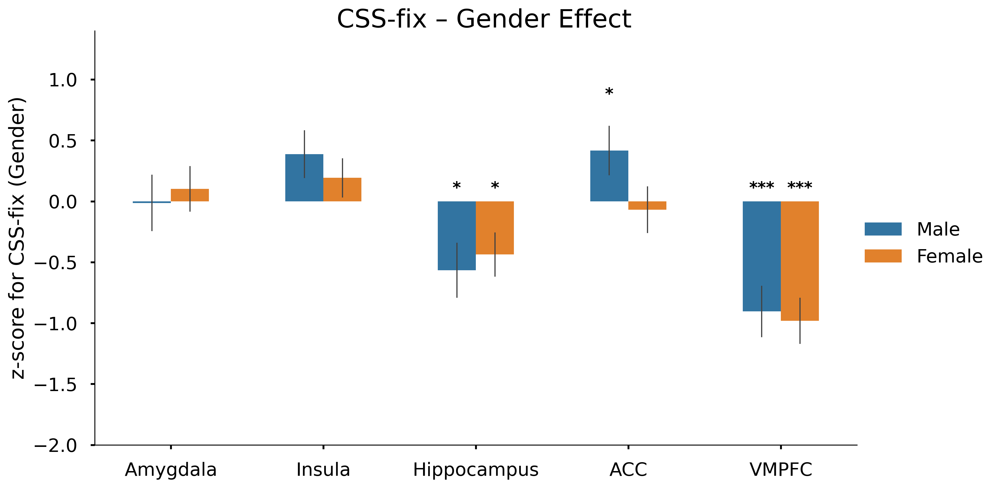


===== Gender main effect: CSminus-fix =====

Model results (Z_score ~ Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Gender[T.Female]                                        0.248     0.92    98    0.360      
Insula          Gender[T.Female]                                       -0.073    -0.28    98    0.783      
Hippocampus     Gender[T.Female]                                        0.200     0.70    98    0.485      
ACC             Gender[T.Female]                                       -0.522    -2.02    98    0.046     *
VMPFC           Gender[T.Female]                                       -0.326    -1.36    98    0.178      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY GENDER LEVEL
ROI             Level       

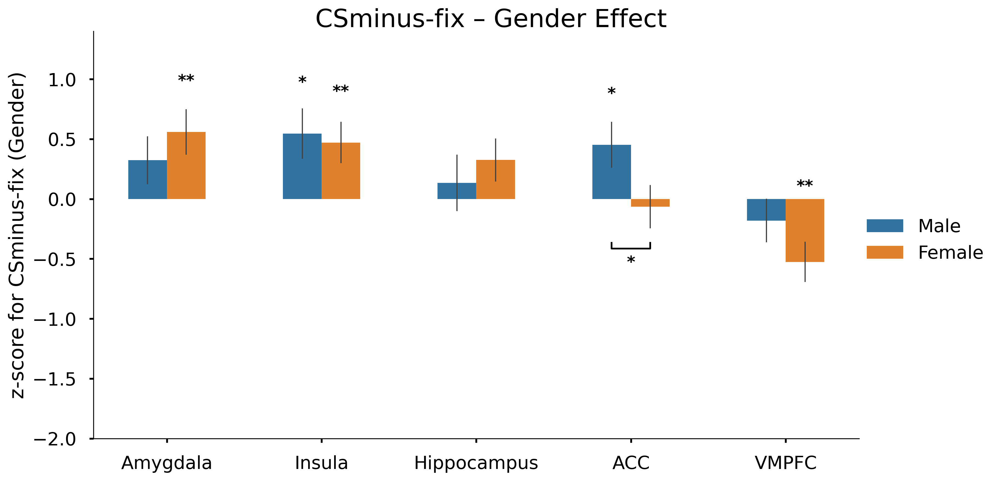

In [12]:
# ---------------------------------------------------------
# 3️⃣ Gender main effect
# ---------------------------------------------------------
for contrast in contrast_list:
    print(f"\n===== Gender main effect: {contrast} =====")
    df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

    g = sns.catplot(
        x='ROI', y='Z_score', hue='Gender',
        order=ROI_list, kind='bar', errorbar='se', height=6, aspect=1.8, width=0.5, 
        err_kws={'linewidth': 1},
        data=df
    )

    ax = g.ax
    add_sig_stars(ax, df, ROI_list, get_matching_model_terms(model, "Gender")[0])

    g.set_axis_labels('', f'z-score for {contrast} (Gender)')
    g.set(ylim=(-2, 1.4))
    g.legend.set_title('')
    g.figure.suptitle(f'{contrast} – Gender Effect', fontsize=22, y=1.02)
    g.figure.set_dpi(300)
    plt.savefig(f'{plot_dir}/{contrast}_Gender_sig.png', bbox_inches='tight')
    plt.show()


===== Group × Drug interaction: CSR-CSS =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.343     0.69    96    0.494      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.154    -0.27    96    0.790      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.357     0.69    96    0.490      
ACC             Group[T.HC]:Drug[T.Placebo]                            -0.140    -0.26    96    0.796      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.438     0.89    96    0.377      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


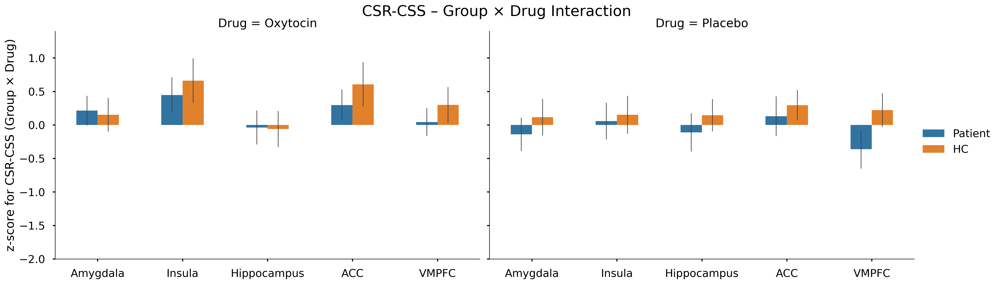


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.4941      
Insula              0.7904      
Hippocampus         0.4900      
ACC                 0.7959      
VMPFC               0.3769      
-----------------------------------


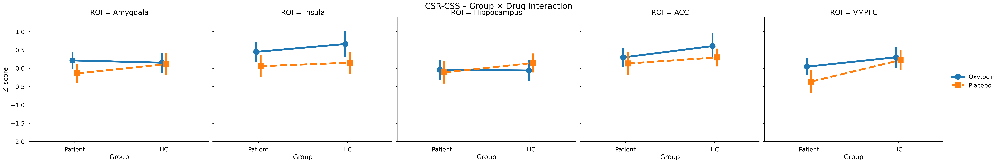


===== Group × Drug interaction: CSR-CS- =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.377     0.69    96    0.495      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.568    -0.98    96    0.328      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.460    -0.84    96    0.405      
ACC             Group[T.HC]:Drug[T.Placebo]                            -0.740    -1.28    96    0.205      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.034     0.06    96    0.949      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


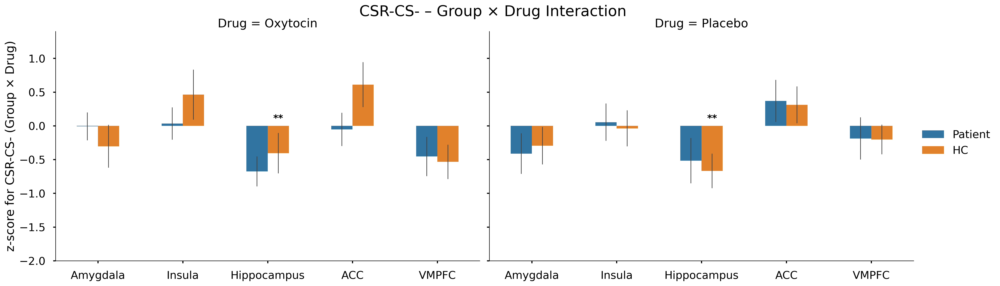


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.4947      
Insula              0.3280      
Hippocampus         0.4051      
ACC                 0.2049      
VMPFC               0.9492      
-----------------------------------


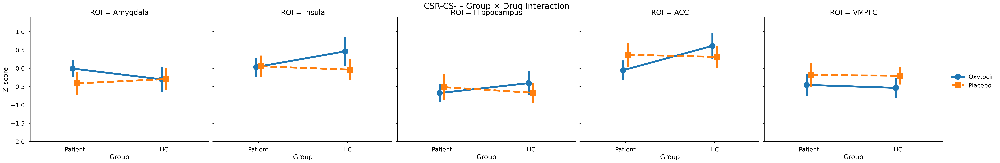


===== Group × Drug interaction: CSS-CS- =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.079     0.15    96    0.879      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.423    -0.82    96    0.412      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.752    -1.50    96    0.138      
ACC             Group[T.HC]:Drug[T.Placebo]                            -0.588    -1.09    96    0.280      
VMPFC           Group[T.HC]:Drug[T.Placebo]                            -0.338    -0.70    96    0.484      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


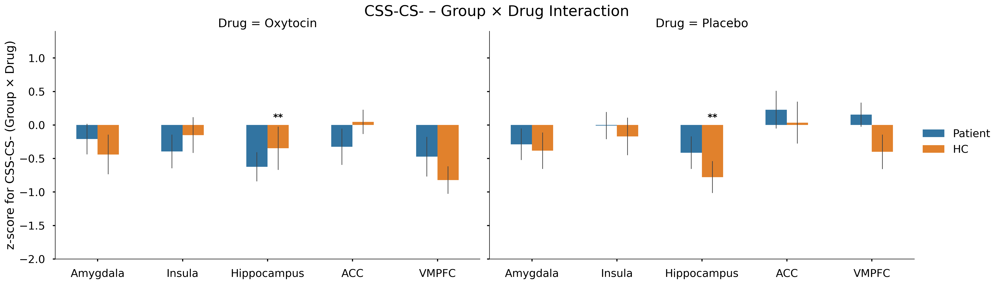


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.8788      
Insula              0.4123      
Hippocampus         0.1382      
ACC                 0.2798      
VMPFC               0.4839      
-----------------------------------


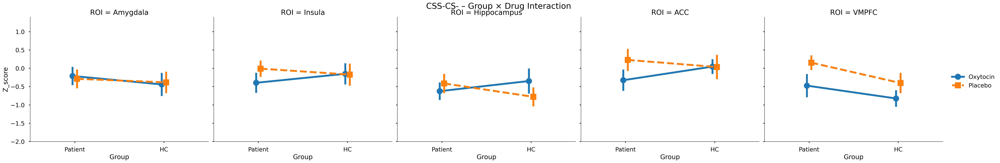


===== Group × Drug interaction: CSR-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.413     0.65    96    0.514      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.241    -0.36    96    0.718      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.092    -0.16    96    0.870      
ACC             Group[T.HC]:Drug[T.Placebo]                            -0.145    -0.24    96    0.811      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.421     0.82    96    0.412      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


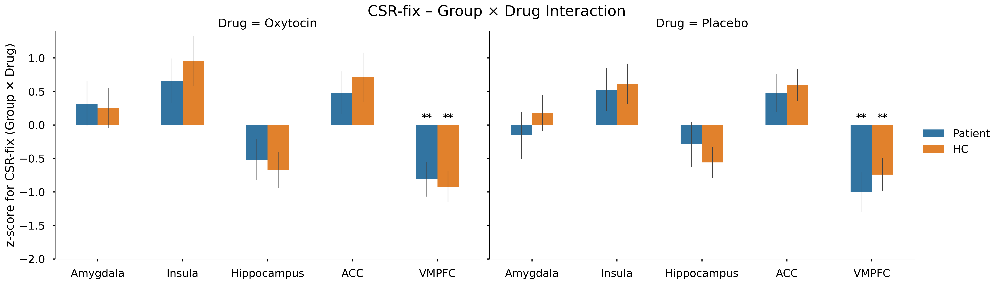


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.5143      
Insula              0.7176      
Hippocampus         0.8703      
ACC                 0.8113      
VMPFC               0.4121      
-----------------------------------


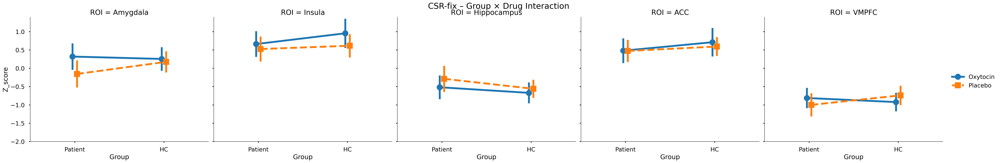


===== Group × Drug interaction: CSS-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.007     0.01    96    0.991      
Insula          Group[T.HC]:Drug[T.Placebo]                            -0.099    -0.20    96    0.843      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                            -0.531    -0.94    96    0.349      
ACC             Group[T.HC]:Drug[T.Placebo]                            -0.026    -0.05    96    0.964      
VMPFC           Group[T.HC]:Drug[T.Placebo]                            -0.132    -0.24    96    0.812      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Drug)


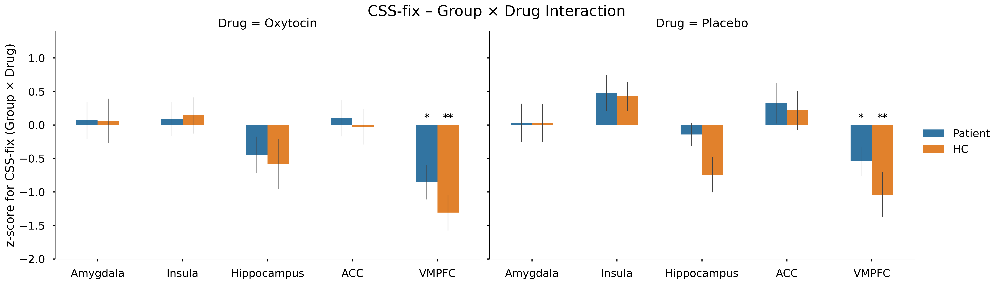


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.9907      
Insula              0.8428      
Hippocampus         0.3489      
ACC                 0.9639      
VMPFC               0.8116      
-----------------------------------


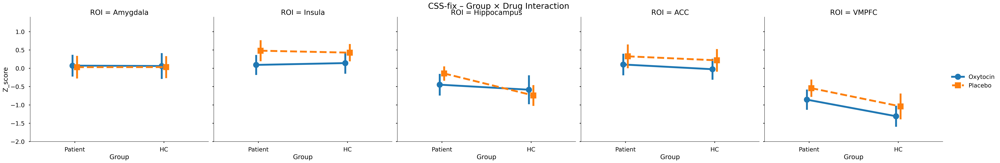


===== Group × Drug interaction: CSminus-fix =====

Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]:Drug[T.Placebo]                            -0.099    -0.18    96    0.857      
Insula          Group[T.HC]:Drug[T.Placebo]                             0.430     0.80    96    0.424      
Hippocampus     Group[T.HC]:Drug[T.Placebo]                             0.448     0.78    96    0.438      
ACC             Group[T.HC]:Drug[T.Placebo]                             0.723     1.37    96    0.175      
VMPFC           Group[T.HC]:Drug[T.Placebo]                             0.352     0.72    96    0.472      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Group × Dr

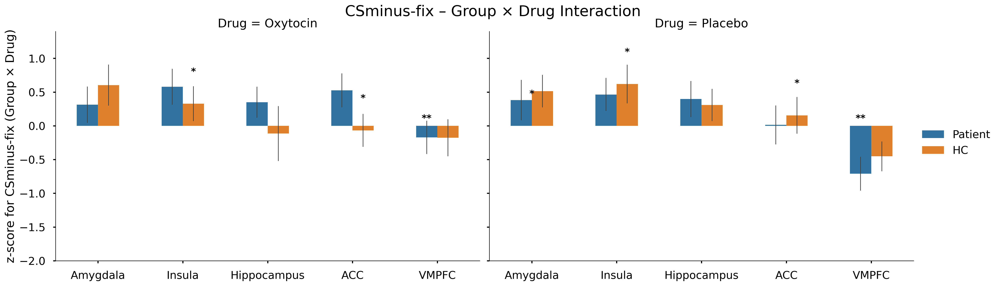


=== Lineplot significance check for Group[T.HC]:Drug[T.Placebo] ===
Model formula: Z_score ~ Group * Drug + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.8575      
Insula              0.4244      
Hippocampus         0.4384      
ACC                 0.1748      
VMPFC               0.4722      
-----------------------------------


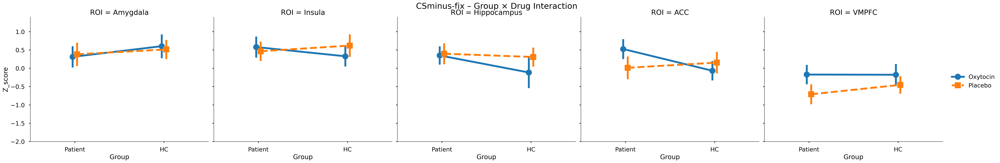


===== Drug × Gender interaction: CSR-CSS =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        1.052     2.16    96    0.033     *
Insula          Drug[T.Placebo]:Gender[T.Female]                        1.135     1.99    96    0.049     *
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                        1.155     2.30    96    0.024     *
ACC             Drug[T.Placebo]:Gender[T.Female]                        0.873     1.63    96    0.107      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                        1.201     2.46    96    0.016     *
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

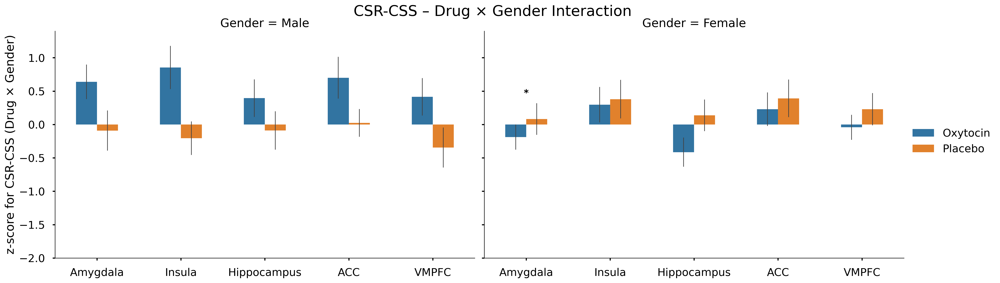


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.0333     *
Insula              0.0490     *
Hippocampus         0.0237     *
ACC                 0.1071      
VMPFC               0.0158     *
-----------------------------------


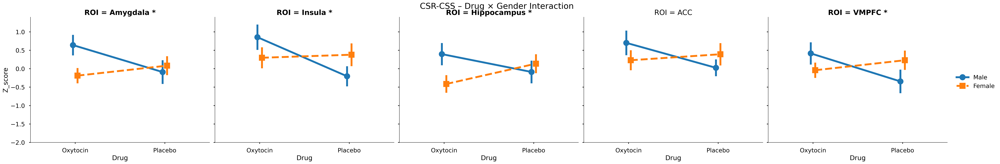


===== Drug × Gender interaction: CSR-CS- =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        0.331     0.61    96    0.545      
Insula          Drug[T.Placebo]:Gender[T.Female]                        0.743     1.28    96    0.203      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                        0.464     0.85    96    0.399      
ACC             Drug[T.Placebo]:Gender[T.Female]                        0.983     1.69    96    0.094      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                        0.993     1.89    96    0.062      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

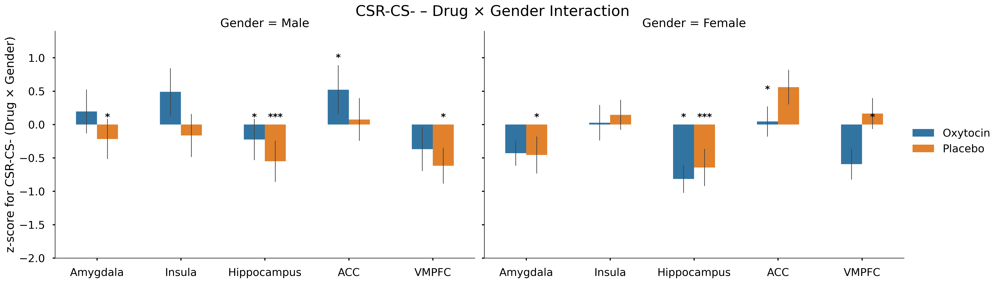


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.5452      
Insula              0.2032      
Hippocampus         0.3994      
ACC                 0.0943      
VMPFC               0.0622      
-----------------------------------


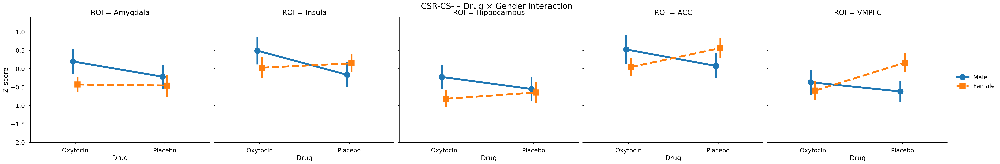


===== Drug × Gender interaction: CSS-CS- =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.664    -1.29    96    0.201      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.337    -0.65    96    0.515      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.669    -1.32    96    0.189      
ACC             Drug[T.Placebo]:Gender[T.Female]                        0.144     0.26    96    0.793      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.163    -0.33    96    0.741      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

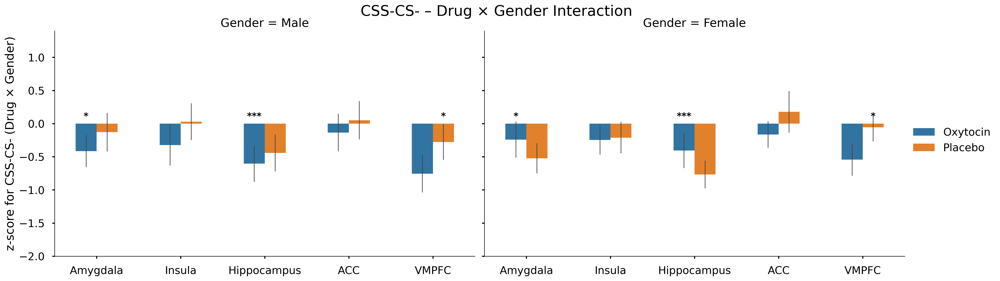


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.2013      
Insula              0.5153      
Hippocampus         0.1894      
ACC                 0.7928      
VMPFC               0.7408      
-----------------------------------


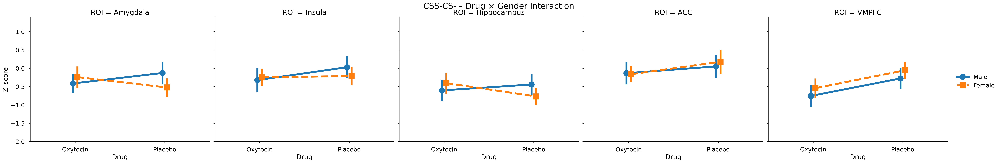


===== Drug × Gender interaction: CSR-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        0.741     1.18    96    0.241      
Insula          Drug[T.Placebo]:Gender[T.Female]                        0.849     1.28    96    0.204      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                        0.359     0.64    96    0.526      
ACC             Drug[T.Placebo]:Gender[T.Female]                        0.962     1.62    96    0.108      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                        1.128     2.24    96    0.027     *
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

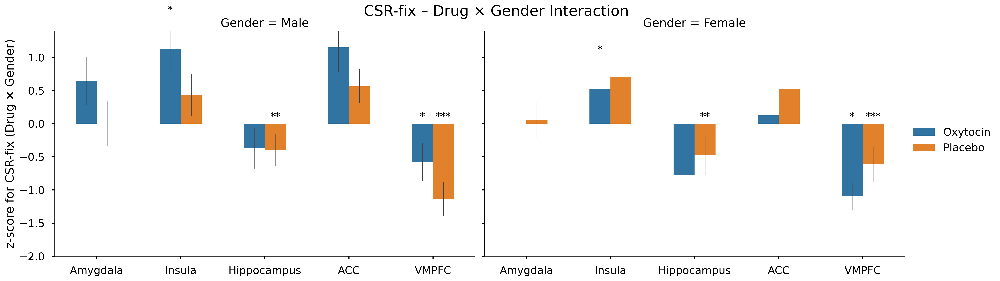


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.2412      
Insula              0.2036      
Hippocampus         0.5260      
ACC                 0.1082      
VMPFC               0.0272     *
-----------------------------------


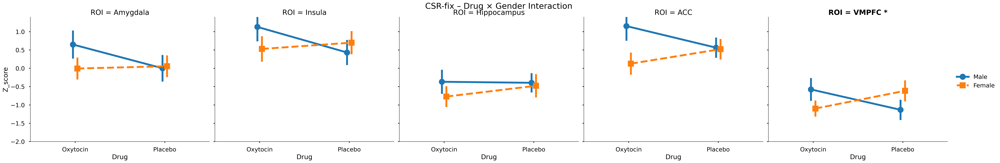


===== Drug × Gender interaction: CSS-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                       -0.564    -0.96    96    0.340      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.644    -1.30    96    0.197      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -1.123    -2.00    96    0.048     *
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.166    -0.30    96    0.768      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.411    -0.73    96    0.466      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × Gende

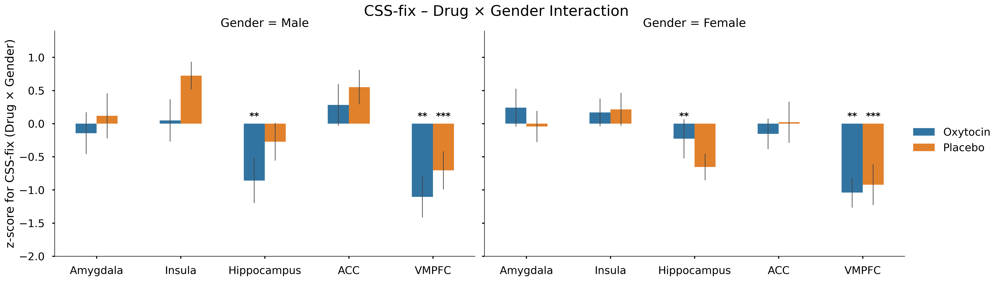


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.3404      
Insula              0.1971      
Hippocampus         0.0485     *
ACC                 0.7677      
VMPFC               0.4662      
-----------------------------------


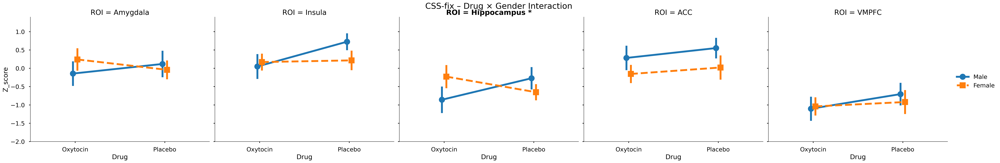


===== Drug × Gender interaction: CSminus-fix =====

Model results (Z_score ~ Drug * Gender + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        0.330     0.60    96    0.551      
Insula          Drug[T.Placebo]:Gender[T.Female]                       -0.153    -0.28    96    0.777      
Hippocampus     Drug[T.Placebo]:Gender[T.Female]                       -0.193    -0.33    96    0.740      
ACC             Drug[T.Placebo]:Gender[T.Female]                       -0.327    -0.62    96    0.535      
VMPFC           Drug[T.Placebo]:Gender[T.Female]                       -0.195    -0.40    96    0.690      
----------------------------------------------------------------------------------------------------
ONE-SAMPLE T-TESTS BY INTERACTION LEVEL (Drug × G

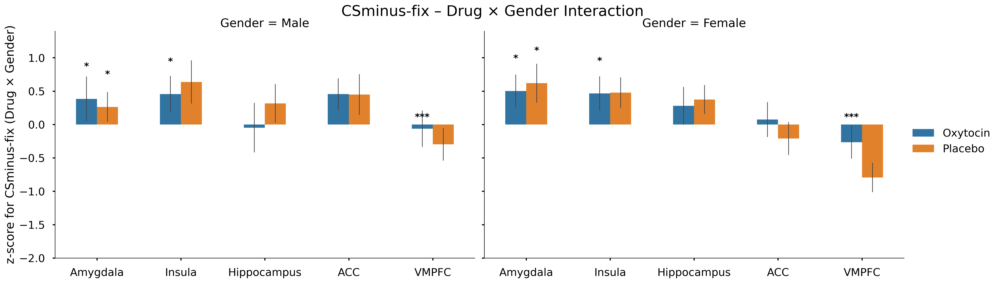


=== Lineplot significance check for Drug[T.Placebo]:Gender[T.Female] ===
Model formula: Z_score ~ Drug * Gender + guess
ROI                p-value   Sig
-----------------------------------
Amygdala            0.5510      
Insula              0.7771      
Hippocampus         0.7400      
ACC                 0.5354      
VMPFC               0.6898      
-----------------------------------


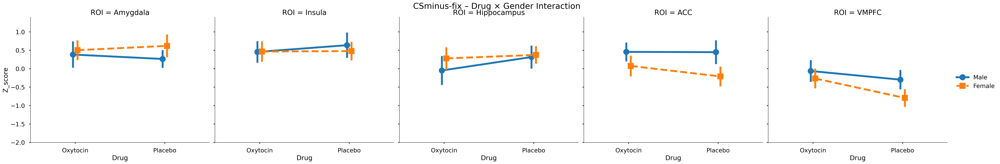

In [13]:
interaction_terms = get_matching_model_terms(model, "two_way")

for term in interaction_terms:
    var1, var2 = extract_factors_from_term(term)
    for contrast in contrast_list:
        print(f"\n===== {var1} × {var2} interaction: {contrast} =====")
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

        g = sns.catplot(
            x='ROI', y='Z_score', hue=var1, col=var2,
            order=ROI_list,
            kind='bar', errorbar='se',
            height=6, aspect=1.6, width=0.5,
            err_kws={'linewidth': 1},
            data=df
        )

        for ax in g.axes.flat:
            add_sig_stars(ax, df, ROI_list, term)

        g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/{contrast}_{var1}_{var2}_interaction_sig.png', bbox_inches='tight')
        plt.show()

        #line plots
        g = sns.catplot(
            data=df,
            x=var1, y='Z_score', hue=var2,
            col='ROI',
            kind='point',         # line plot (mean + SE)
            errorbar='se',        # ✅ correct for seaborn ≥0.12
            dodge=True,
            markers=['o', 's'],
            linestyles=['-', '--'],
            height=6, aspect=1.2
        )
        add_sig_stars_lineplot_interaction(
            g.axes, df, ROI_list, term
        )
        #g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/line_{contrast}_{var1}_{var2}_interaction_sig.png', bbox_inches='tight')
        plt.show()

In [14]:
interaction_terms = get_matching_model_terms(model, "three_way")

for term in interaction_terms:
    var1, var2, var3 = extract_factors_from_term(term)
    for contrast in contrast_list:
        print(f"\n===== {var1} × {var2}  × {var3} interaction: {contrast} =====")
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

        g = sns.catplot(
            x='ROI', y='Z_score', hue=var1, col=var2, row=var3,
            order=ROI_list,
            kind='bar', errorbar='se',
            height=6, aspect=1.6, width=0.5,
            err_kws={'linewidth': 1},
            data=df
        )

        for ax in g.axes.flat:
            add_sig_stars(ax, df, ROI_list, term)

        g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2} × {var3})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2}  × {var3} Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/{contrast}_{var1}_{var2}_{var3}_interaction_sig.png', bbox_inches='tight')
        plt.show()

        #line plots
        g = sns.catplot(
            data=df,
            x=var1, y='Z_score', hue=var2, row=var3,
            col='ROI',
            kind='point',         # line plot (mean + SE)
            errorbar='se',        # ✅ correct for seaborn ≥0.12
            dodge=True,
            markers=['o', 's'],
            linestyles=['-', '--'],
            height=6, aspect=1.2
        )
        add_sig_stars_lineplot_interaction(
            g.axes, df, ROI_list, "Group[T.HC]:Gender[T.Female]"
        )
        #g.set_axis_labels('', f'z-score for {contrast} ({var1} × {var2})')
        g.set(ylim=(-2, 1.4))
        g.legend.set_title('')
        g.figure.suptitle(f'{contrast} – {var1} × {var2} × {var3}Interaction', fontsize=22, y=1.02)
        g.figure.set_dpi(300)
        plt.savefig(f'{plot_dir}/line_{contrast}_{var1}_{var2}_{var3}_interaction_sig.png', bbox_inches='tight')
        plt.show()

In [15]:

formula = "Z_score ~ Group + Drug + Gender + guess + Group * Drug + Drug * Gender"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Group + Drug + Gender + guess + Group * Drug + Drug * Gender) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                            -0.177    -0.51    94     0.6090      
Amygdala        Drug[T.Placebo]                                        -0.981    -2.18    94     0.0321     *
Amygdala        Gender[T.Female]                                       -0.865    -2.52    94     0.0135     *
Amygdala        guess[T.1.0]                                            0.199     0.75    94     0.4559      
Amygdala        Group[T.HC]:Drug[T.Placebo]                             0.465     0.95    94     0.3455      
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        1.104     2.24    94     0.0275     *
Insula          Group[T.HC]     

In [16]:

formula = "Z_score ~ Group * Drug + guess"

print(f"\nModel results ({formula})")
print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
print("-" * 100)

# === Table 1: Model results ===
for i, roi in enumerate(ROI_list):
    df_roi = df[df["ROI"] == roi]
    if len(df_roi) < 4:
        continue
    model = smf.ols(formula, data=df_roi).fit()
    dfree = int(model.df_resid)

    # Extract and print all terms except intercept
    for term in model.params.index:
        if term.lower() == "intercept":
            continue

        beta = model.params[term]
        tval = model.tvalues[term]
        pval = model.pvalues[term]
        star = significance_marker(pval)

        print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
              f"{dfree:>5} {pval:>10.4f} {star:>5}")

print("-" * 100)
    


Model results (Z_score ~ Group * Drug + guess)
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.246     0.64    96     0.5265      
Amygdala        Drug[T.Placebo]                                         0.103     0.26    96     0.7942      
Amygdala        guess[T.1.0]                                            0.251     0.85    96     0.3970      
Amygdala        Group[T.HC]:Drug[T.Placebo]                            -0.099    -0.18    96     0.8575      
Insula          Group[T.HC]                                            -0.269    -0.72    96     0.4759      
Insula          Drug[T.Placebo]                                        -0.101    -0.26    96     0.7934      
Insula          guess[T.1.0]                                            0.103     0

In [17]:

formula = "Z_score ~ Group + Gender + guess"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Group + Gender + guess) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Group[T.HC]                                             0.043     0.18    97     0.8604      
Amygdala        Gender[T.Female]                                       -0.321    -1.30    97     0.1969      
Amygdala        guess[T.1.0]                                            0.119     0.47    97     0.6400      
Insula          Group[T.HC]                                             0.117     0.41    97     0.6856      
Insula          Gender[T.Female]                                        0.023     0.08    97     0.9359      
Insula          guess[T.1.0]                                            0.001     0.00    97     0.9976      
Hippocampus     Group[T.HC]                                           

In [18]:

formula = "Z_score ~ Drug * Gender + guess"

for contrast in contrast_list:
        df = df_all.loc[(df_all['Contrast'] == contrast) & (df_all['Phase'] == 'phase3')]

        print(f"\nModel results ({formula}) in {contrast}")
        print(f"{'ROI':<15} {'Variable':<50} {'β':>10} {'t':>8} {'df':>5} {'p':>8} {'Sig':>5}")
        print("-" * 100)

        # === Table 1: Model results ===
        for i, roi in enumerate(ROI_list):
            df_roi = df[df["ROI"] == roi]
            if len(df_roi) < 4:
                continue
            model = smf.ols(formula, data=df_roi).fit()
            dfree = int(model.df_resid)

            # Extract and print all terms except intercept
            for term in model.params.index:
                if term.lower() == "intercept":
                    continue

                beta = model.params[term]
                tval = model.tvalues[term]
                pval = model.pvalues[term]
                star = significance_marker(pval)

                print(f"{roi:<15} {term:<50} {beta:>10.3f} {tval:>8.2f} "
                    f"{dfree:>5} {pval:>10.4f} {star:>5}")

        print("-" * 100)
    


Model results (Z_score ~ Drug * Gender + guess) in CSR-CSS
ROI             Variable                                                    β        t    df        p   Sig
----------------------------------------------------------------------------------------------------
Amygdala        Drug[T.Placebo]                                        -0.716    -2.01    96     0.0467     *
Amygdala        Gender[T.Female]                                       -0.845    -2.49    96     0.0145     *
Amygdala        guess[T.1.0]                                            0.167     0.64    96     0.5250      
Amygdala        Drug[T.Placebo]:Gender[T.Female]                        1.052     2.16    96     0.0333     *
Insula          Drug[T.Placebo]                                        -1.062    -2.56    96     0.0121     *
Insula          Gender[T.Female]                                       -0.555    -1.40    96     0.1647      
Insula          guess[T.1.0]                                           